#Aplicação de um Modelo Pré-treinado

Nesta prática, vamos ver como importar os pesos pré-treinados da arquitetura ResNet50 e classificar algumas imagens.

In [1]:
!pip3 install --upgrade tensorflow==2.15 &> /dev/null

In [2]:
%%capture
%matplotlib inline
!wget --no-check-certificate 'https://github.com/alceubissoto/inf0618/raw/master/images.zip' -O images.zip
!unzip -n images.zip

In [3]:
import os
import numpy as np
from random import sample, seed
seed(42)

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (15,15)
import tensorflow as tf
from tensorflow import keras
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.preprocessing.image import load_img, img_to_array
from keras.utils import get_file

# Funções auxiliares para ler imagens do disco e plotar resultados
def readImagesFromDir(imgDirPath):
    fileNames = os.listdir(imgDirPath)
    imagePaths = [os.path.join(imgDirPath,img) for img in fileNames if img[-3:] in ['jpg', 'png']]
    imageList = [load_img(img, target_size=(224, 224)) for img in imagePaths] # quis manter as dimensões
    imageList = [img_to_array(img) for img in imageList]
    return imageList, fileNames

# Plota as imagens de imgList
def plotImages(imgList):
    for i in range(len(imgList)):
        plotImage(imgList[i])

def plotImage(img):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)

    ax.imshow(np.uint8(img), interpolation='BICUBIC')
    plt.show()

# ResNet

A ResNet foi a solução vencedora da ILSVRC 2015, com uma performance no top-5 apresentando error rate de 3,57%.
O artigo original está disponível no [arXiv](https://arxiv.org/abs/1512.03385).

Nesta atividade, vamos definir a _ResNet_ em Keras, importar os pesos pré-treinados e classificar algumas imagens.


## Módulo Residual

O bloco básico da _ResNet_ é o Módulo Residual, que adiciona um _shortcut_, onde a entrada é somada ao resultado de uma série de convoluções antes da saída do módulo.

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/ResBlock.png">


Diagrama de _ResNets_ com diferentes números de camadas. A última camada é sempre average pooling

<img src="https://neurohive.io/wp-content/uploads/2019/01/resnet-architectures-34-101.png">

Vamos instanciar um modelo da _ResNet50_. Qualquer modelo do Keras tem o método `summary()`, que imprime uma tabela sobre cada camada do modelo.

In [4]:
model = tf.keras.applications.ResNet50(include_top=True, weights="imagenet")
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

# Visualizando a rede

In [5]:
!pip3 install visualkeras # Instalação do pacote visualkeras para visualização
# Para saber sobre mais pacotes de visualização: https://github.com/ashishpatel26/Tools-to-Design-or-Visualize-Architecture-of-Neural-Network

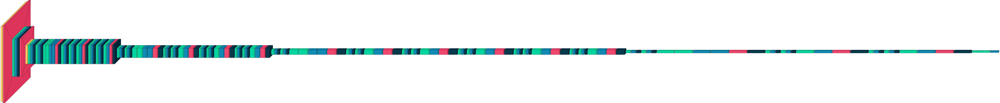

In [6]:
import visualkeras

visualkeras.layered_view(model).show() # Visualizando a rede
visualkeras.layered_view(model)

#visualkeras.layered_view(model, to_file='output.png') # para salvar
#visualkeras.layered_view(model, to_file='output.png').show() # para salvar e mostrar

## Predição

A pasta `./images` contém algumas imagens da competição [ImageNet](http://www.image-net.org/challenges/LSVRC/), composta de uma coleção de imagens associadas a 1000 classes (note que a dimensão do vetor de predição tem tamanho 1000). A maioria dos modelos pré-treinados disponíveis foram treinados neste conjunto de dados.

Vamos carregar as imagens, pré-processá-las com a função `preprocess_input()` que já redimensiona e normaliza as imagens e fazer a predição das classes usando o modelo da _ResNet_.

**Você pode adicionar ou remover imagens da pasta `./images` para testar a rede nas suas próprias imagens.**

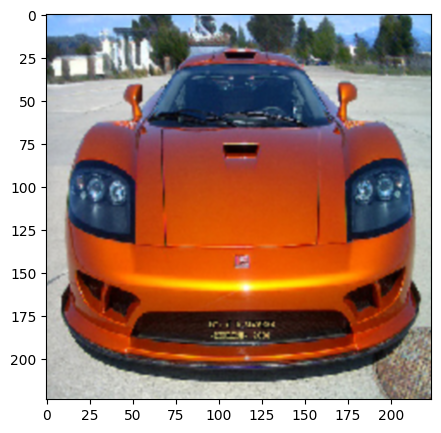

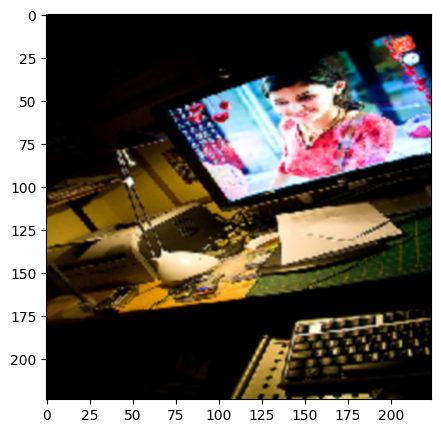

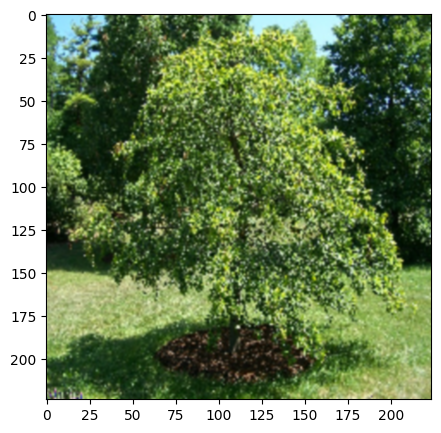

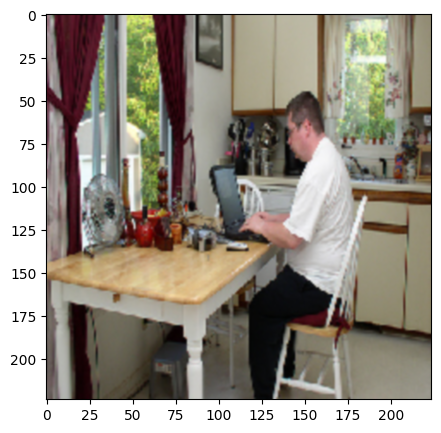

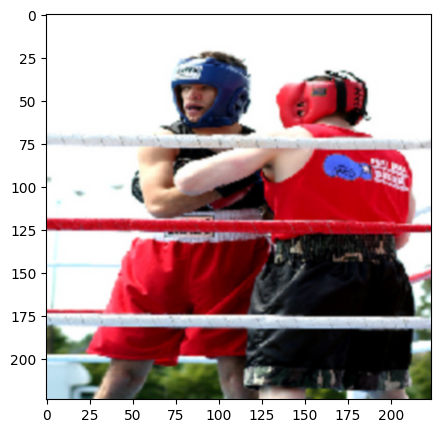

...

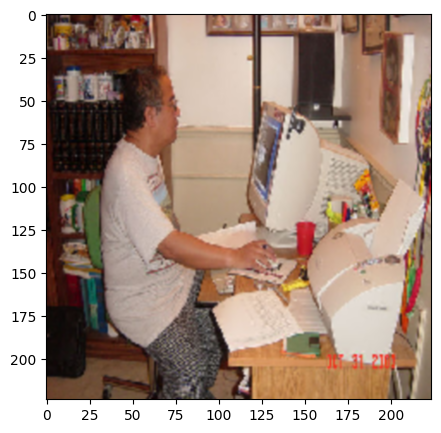

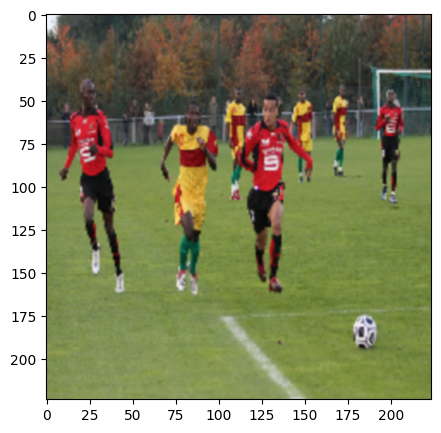

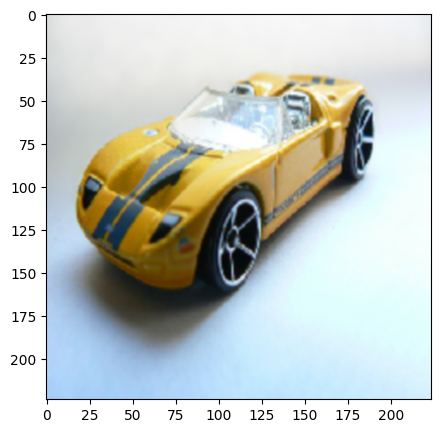

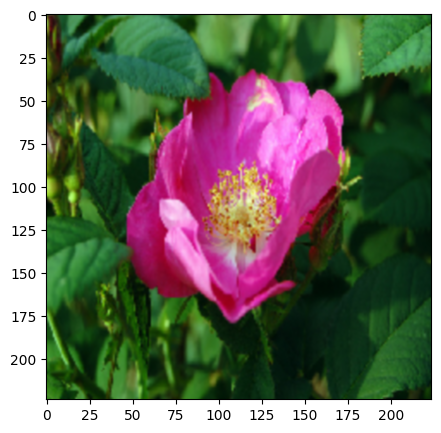

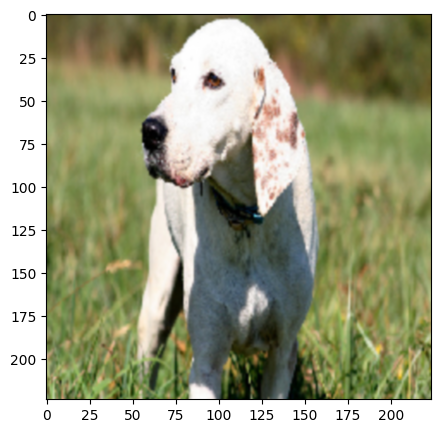

In [7]:
# Carrega e plota as imagens
imgList, fileNames = readImagesFromDir('./images')
plotImages(imgList)

In [8]:
# Pré-processa as imagens
processed_images = np.array([preprocess_input(img.copy()) for img in imgList])

# Prediz classes com a ResNet
predictions = model.predict(processed_images, verbose=0)

print("Dimensões da predição:", predictions.shape)

Dimensões da predição: (17, 1000)


Keras também fornece a função auxiliar `decode_predictions()`, que associa a predição da rede às classes da ImageNet. Desta maneira, conseguimos expressar as predições de maneira significativa, ao invés de índices de 1 a 1000. "Essa imagem é a do cachorro"

Image  01 :     car2.jpg


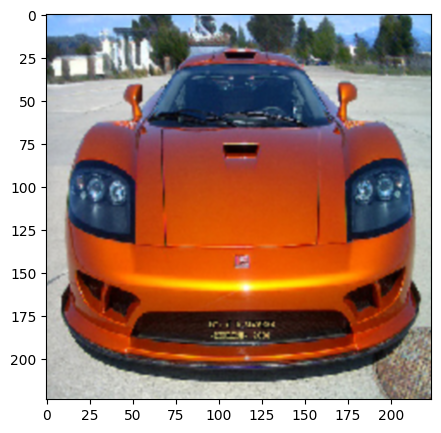

sports_car 0.9368193
grille 0.030215094
convertible 0.0112688495
car_wheel 0.009218978
racer 0.0053577763


Image  02 :     pc3.jpg


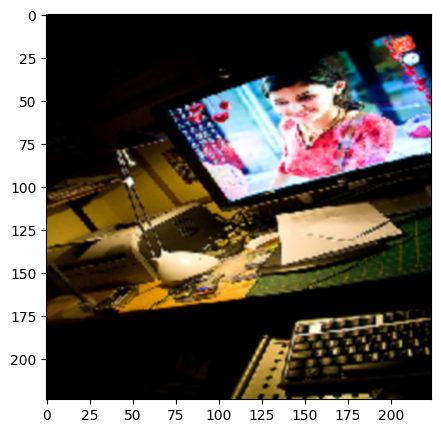

desktop_computer 0.6570762
desk 0.10107321
monitor 0.09920906
computer_keyboard 0.0613598
screen 0.022531155


Image  03 :     forest3.jpg


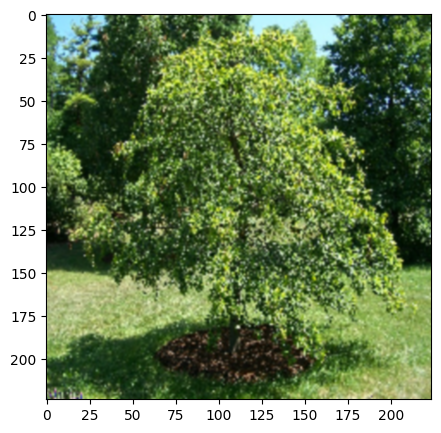

maze 0.32080862
pot 0.13813527
buckeye 0.1144197
park_bench 0.06531236
greenhouse 0.059989456


Image  04 :     pc1.jpg


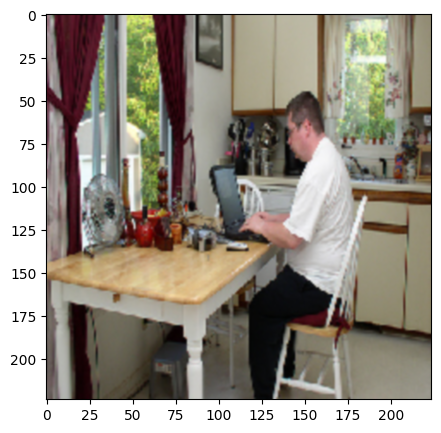

barbershop 0.2722384
restaurant 0.1496491
barber_chair 0.10736206
dining_table 0.10475326
crutch 0.058258563


Image  05 :     boxing.jpg


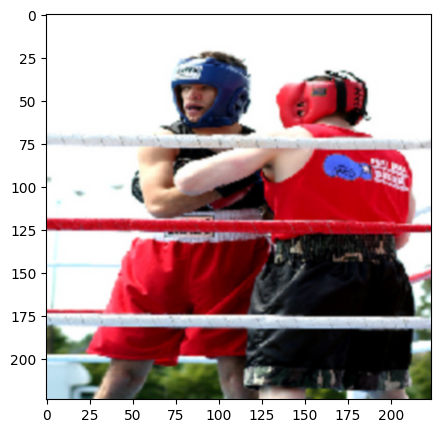

crash_helmet 0.49291366
football_helmet 0.22062004
knee_pad 0.05936294
bicycle-built-for-two 0.029745016
ski 0.020887306


Image  06 :     car1.jpg


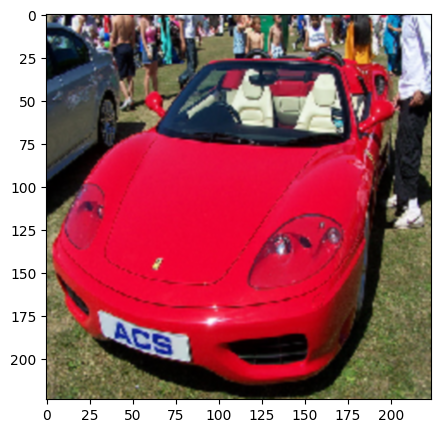

sports_car 0.5178441
convertible 0.4125252
car_wheel 0.052469105
grille 0.0059319097
amphibian 0.0027402348


Image  07 :     funghi2.jpg


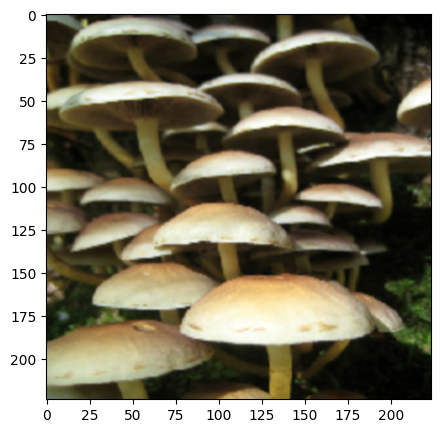

mushroom 0.99460655
bolete 0.0037175762
agaric 0.0015907725
hen-of-the-woods 7.559541e-05
earthstar 6.7576107e-06


Image  08 :     forest5.jpg


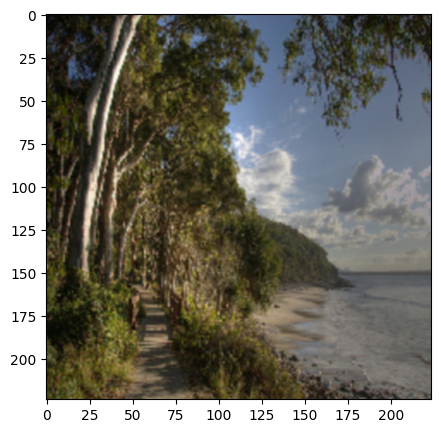

lakeside 0.44876927
seashore 0.22427693
valley 0.118965216
breakwater 0.08779502
cliff 0.04873698


Image  09 :     plant.jpg


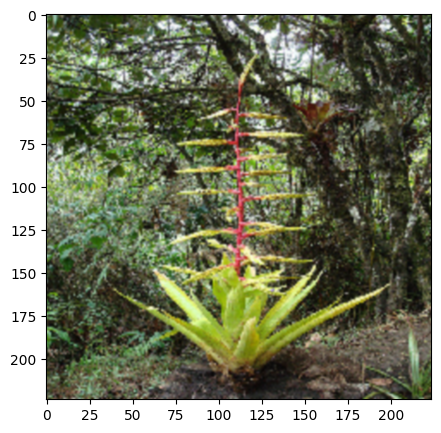

maypole 0.7974023
grasshopper 0.048913706
pineapple 0.031492937
walking_stick 0.026858741
mantis 0.011125204


Image  10 :     forest1.jpg


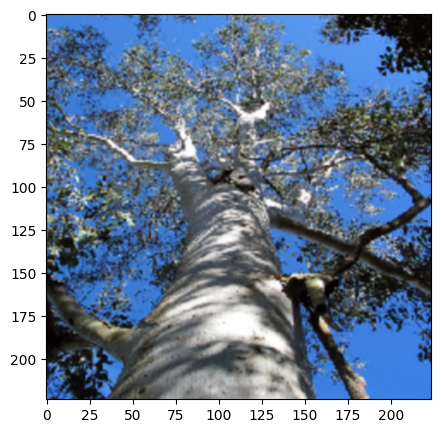

totem_pole 0.17692547
stupa 0.12179407
tiger_cat 0.11928924
pole 0.0733837
tabby 0.06718055


Image  11 :     funghi.jpg


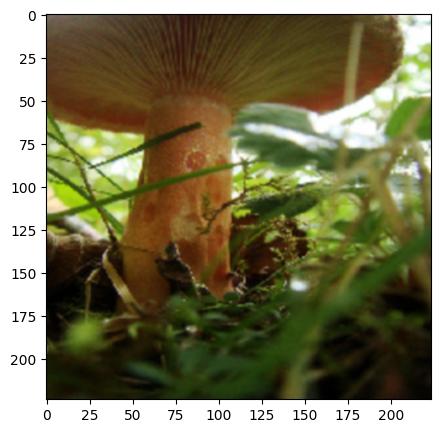

mushroom 0.8701454
agaric 0.08398387
bolete 0.045615714
stinkhorn 0.00012182654
gyromitra 5.4035863e-05


Image  12 :     pc.jpg


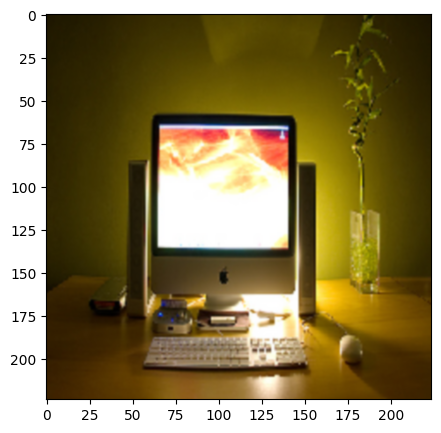

desktop_computer 0.30504596
monitor 0.2828005
mouse 0.08618686
screen 0.068845086
desk 0.06486966


Image  13 :     pc4.jpg


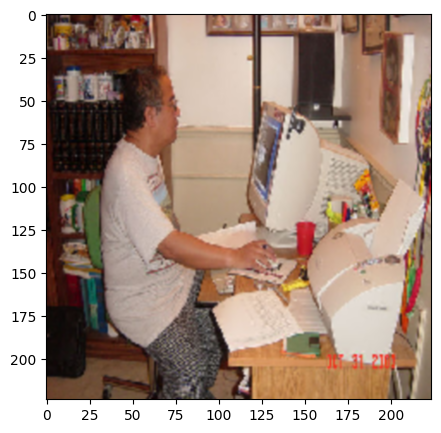

carton 0.2160882
refrigerator 0.080733255
confectionery 0.053134732
sewing_machine 0.052006733
punching_bag 0.049503736


Image  14 :     soccer.jpg


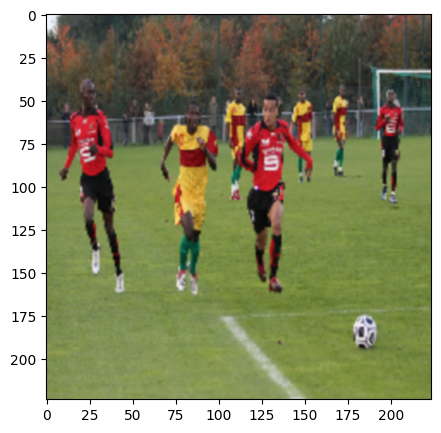

rugby_ball 0.77759606
parachute 0.10110895
soccer_ball 0.077658996
bearskin 0.023555942
volleyball 0.008584094


Image  15 :     car3.jpg


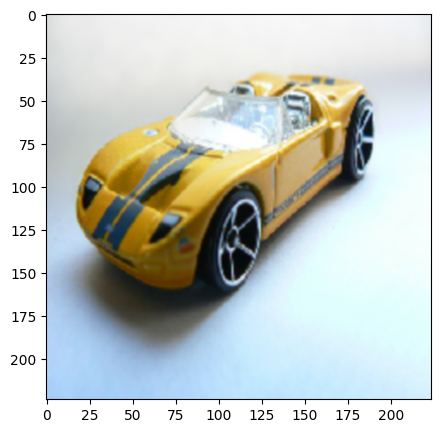

sports_car 0.6646187
racer 0.25477448
car_wheel 0.06478024
cab 0.003748233
grille 0.0033597534


Image  16 :     flower.jpg


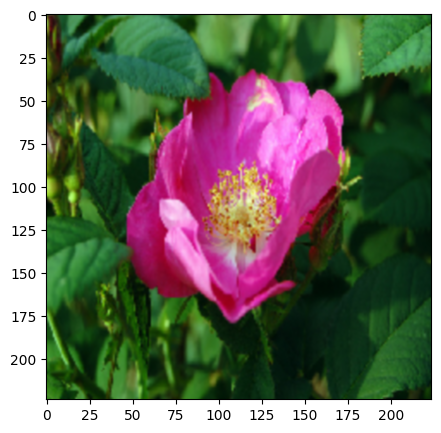

bee 0.3697414
cabbage_butterfly 0.12441656
sulphur_butterfly 0.07697615
pot 0.07182832
monarch 0.045174327


Image  17 :     dog1.jpg


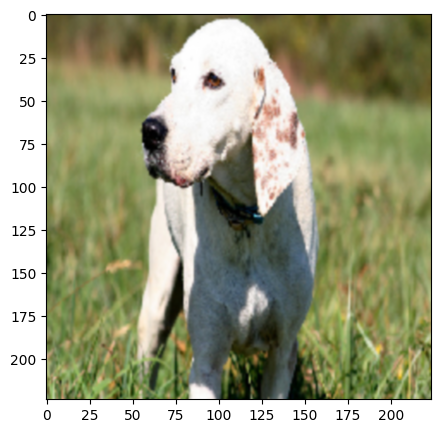

Great_Dane 0.35119474
standard_poodle 0.16837128
English_foxhound 0.13516217
Walker_hound 0.06864551
Bedlington_terrier 0.059293907




In [9]:
# Converte as probabilidades de cada classe para os rótulos associados.
# Por padrão, a função decode_predictions() retorna as top 5 classes.
# Printa a probabilidade de pertencer a cada classe
imagePredictions = decode_predictions(predictions)
i = 0
for pred in imagePredictions:
    print("Image ", str(i+1).zfill(2), ":    ", fileNames[i])
    plotImage(imgList[i])
    for possibleClass in pred:
        print(possibleClass[1], possibleClass[2])
    print("\n")
    i+=1

Para mais informações, em algum atendimento podemos conversar sobre interpretabilidade!

![GRADCAM](https://glassboxmedicine.files.wordpress.com/2020/05/modified-figure-1-dog-cat.png)

### Referência
- ResNet on Keras: https://keras.io/api/applications/resnet/#resnet50-function
- https://towardsdatascience.com/understanding-resnet-and-its-variants-719e5b8d2298